In [1]:
import pandas as pd
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import *
import string
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix
import seaborn
#from textstat.textstat import *
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
import numpy as np
from nltk.sentiment.vader import SentimentIntensityAnalyzer as VS
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

In [2]:
#DATA Colection 1
import requests
from bs4 import BeautifulSoup
import json
import urllib.request,sys,time

columns = ['Category','Link'] 
df = pd.DataFrame(columns = columns)  # initialize an empty dataframe with column names
base_url = 'https://nigeriacrime.com/'

categories =  ['kidnapping','murder', 'fraud', 'domestic-violence', 'abuse',]  # news categories we are interested in

'''Search through each news based category in nigeriacrime website and for each news article, extract the details and append it to the dataframe'''
for cat in categories:
  for page_number in range(1, 21):
    url = base_url + 'category' + '/' + cat + '/'  if page_number == 1 else base_url + 'category' + '/' + cat + '/' + 'page/'+str(page_number) + '/'
    
    #catch exception
    try:
      page=requests.get(url) 
    except Exception as e:    
      error_type, error_obj, error_info = sys.exc_info()      
      print ('ERROR FOR LINK:',url)               
      print (error_type, 'Line:', error_info.tb_lineno)
      continue

      #if web page avails...
    if page.status_code == 200:
      soup = BeautifulSoup(page.text, "html.parser")
      articles = soup.find_all('div',attrs={'class':'td-module-thumb'})
      for article in articles:
          nurl = article.find("a").get("href")
          
          # ... your code to extract data 
          data = {'Category': cat, 'Link': nurl}
          # Create a single-row DataFrame from the data
          new_row_df = pd.DataFrame(data, index=[0])
          # Append the new row to the DataFrame
          df = pd.concat([df, new_row_df], ignore_index=True)

In [63]:
# Save First DataFrame to CSV file
df.to_csv('nigeriacrime_url.csv', index=False)
print('Category + url scraped and saved to nigeriacrime_url.csv')

Category + url scraped and saved to nigeriacrime_url.csv


In [2]:
nurl=pd.read_csv('nigeriacrime_url.csv')
nurl.shape

(1149, 2)

In [4]:
nurl['Link'][1148]

'https://nigeriacrime.com/school-bus-driver-jail-for-life-for-molesting-five-years-old/'

In [6]:
import requests
from bs4 import BeautifulSoup
import json
import urllib.request,sys,time


In [14]:
#DATA Colection 2
columns = ['Category','Date','Location', 'Text']
blank = ""
df1 = pd.DataFrame(columns = columns)  # initialize an empty dataframe with column names
base_url = nurl['Link']

categories =  nurl['Category']  # calling news categories from the first csv
length = len(nurl)

'''Search through each row in the first csv, use the saved url to visit the website and for each news article, extract the date and excerpt'''
for row in range(1, length):
    url = base_url[row]
    
    try:
      page=requests.get(url) 
    except Exception as e:    
      error_type, error_obj, error_info = sys.exc_info()      
      print ('ERROR FOR LINK:',url)               
      print (error_type, 'Line:', error_info.tb_lineno)
      continue
        
    if page.status_code == 200:
      soup = BeautifulSoup(page.text, "html.parser")
      articles = soup.find_all('div', class_= 'tdb-block-inner td-fix-index')
      article3 = soup.find('time', class_='entry-date updated td-module-date').text.strip()
      data = []# Empty list to store paragraphs
        
      for div in articles:
        paragraphs = div.find_all('p')
        if paragraphs:
            text = ''.join([p.get_text().strip() for p in paragraphs]).replace("'\n'", "")
            data ={'Category': categories[row], 'Date': article3, 'Location': blank, 'Text': text}
            new_row_df = pd.DataFrame(data, index=[0])
            df1 = pd.concat([df1, new_row_df], ignore_index=True)
      if row % 10 == 0:
          print( row,'/', length,' Pages Scrapped !!')
print( ' DONE !!')

10 / 1149  Pages Scrapped !!
20 / 1149  Pages Scrapped !!
30 / 1149  Pages Scrapped !!
40 / 1149  Pages Scrapped !!
50 / 1149  Pages Scrapped !!
60 / 1149  Pages Scrapped !!
70 / 1149  Pages Scrapped !!
80 / 1149  Pages Scrapped !!
90 / 1149  Pages Scrapped !!
100 / 1149  Pages Scrapped !!
110 / 1149  Pages Scrapped !!
120 / 1149  Pages Scrapped !!
130 / 1149  Pages Scrapped !!
140 / 1149  Pages Scrapped !!
150 / 1149  Pages Scrapped !!
160 / 1149  Pages Scrapped !!
170 / 1149  Pages Scrapped !!
180 / 1149  Pages Scrapped !!
190 / 1149  Pages Scrapped !!
200 / 1149  Pages Scrapped !!
210 / 1149  Pages Scrapped !!
220 / 1149  Pages Scrapped !!
230 / 1149  Pages Scrapped !!
240 / 1149  Pages Scrapped !!
250 / 1149  Pages Scrapped !!
260 / 1149  Pages Scrapped !!
270 / 1149  Pages Scrapped !!
280 / 1149  Pages Scrapped !!
290 / 1149  Pages Scrapped !!
300 / 1149  Pages Scrapped !!
310 / 1149  Pages Scrapped !!
320 / 1149  Pages Scrapped !!
330 / 1149  Pages Scrapped !!
340 / 1149  Pages S

In [ ]:
# Save First DataFrame to CSV file
df1.to_csv('nigeriacrime_news.csv', index=False)
print('CONGRATULATIONS \n News contents scraped and now saved to nigeriacrime_news.csv')

In [272]:
dk= pd.read_csv("nigeriacrime_news.csv")
dk.shape

(1138, 4)

In [27]:
dk

,Category,Date,Location,Text
0,kidnapping,"March 30, 2024",Ogun,:Ogun State Police Command on Friday confirmed...
1,kidnapping,"March 28, 2024",Katsina,The Katsina State Police Command rescued five ...
2,kidnapping,"March 24, 2024",Sokoto,Troops of Operation Hadarin Daji have rescued ...
3,kidnapping,"March 23, 2024",Akwa Ibom,An Akwa Ibom couple elder Nyaknobong Etuk and ...
4,kidnapping,"March 23, 2024",Kwara,"A Chinese Nationale, Mr Peng Chao Zhang who wa..."
...,...,...,...,...
1133,abuse,"June 13, 2022",Imo,Pandemonium as Youth went on rampage at Ehim M...
1134,abuse,"June 9, 2022",Abuja,The University of Abuja (UniAbuja) on Monday d...
1135,abuse,"June 7, 2022",Osun,"Kazeem Badmus Olumide Adesina, the father of a..."
1136,abuse,"May 25, 2022",Lagos,"A junior student of Simple Faith Schools, Agba..."


In [19]:
#Checking for missing value at first instance
dk.isna().sum()

Category       0
Date           0
Location    1148
Text           0
dtype: int64

In [33]:
#Checking for missing value after manual labelling of location
dk.isna().sum()

Category    0
Date        0
Location    0
Text        0
dtype: int64

In [40]:
len(dk)

1138

In [121]:
#extracting and storing all crimeprone states
length1= len(dk)
crime_cat=[]
areas= []
area= dk['Location']
for rw in range(1, length1):
    if area[rw].lower() not in areas:
        areas.append(area[rw].lower())
    if dk['Category'][rw] not in crime_cat:
        crime_cat.append(dk['Category'][rw])
    
print(areas)
print('\n \n',crime_cat)

['katsina', 'sokoto', 'akwa ibom', 'kwara', 'ogun', 'kaduna', 'edo', 'kogi', 'taraba', 'adamawa', 'benue', 'lagos', 'kano', 'abuja', 'ekiti', 'abia', 'delta', 'oyo', 'river', 'niger', 'ondo', 'bayelsa', 'imo', 'nasarawa', 'enugu', 'anambra', 'plateau', 'cross river', 'zamfara', 'kebbi', 'yobe', 'borno', 'bauchi', 'osun', 'jigawa', 'gombe', 'ebonyi']

 
 ['kidnapping', 'murder', 'fraud', 'domestic-violence', 'abuse']


In [123]:
#extracting and storing kidnapping crime stat into a dictionary
catg= dk['Category']
loct= dk['Location']
value=[0] * 37
kidn={}
for state in range(0, 37):
    for row in range(0, 1138):
        if catg[row] == 'kidnapping' :
            if areas[state] == loct[row].lower():
                value[state]+= 1
                kidn[areas[state]] = value[state]
print(kidn)

{'katsina': 11, 'sokoto': 3, 'akwa ibom': 4, 'kwara': 15, 'ogun': 10, 'kaduna': 17, 'edo': 1, 'kogi': 9, 'taraba': 9, 'adamawa': 6, 'benue': 22, 'lagos': 23, 'kano': 5, 'abuja': 21, 'ekiti': 7, 'abia': 7, 'delta': 14, 'oyo': 2, 'river': 12, 'niger': 3, 'ondo': 7, 'bayelsa': 4, 'imo': 5, 'nasarawa': 10, 'enugu': 2, 'anambra': 4, 'plateau': 6, 'cross river': 4, 'zamfara': 8, 'kebbi': 2, 'yobe': 2, 'borno': 2, 'bauchi': 3, 'osun': 1}


In [125]:
#extracting and storing murder crime stat into a dictionary
catg= dk['Category']
loct= dk['Location']
value2=[0] * 37
murd={}
for state2 in range(0, 37):
    for row2 in range(0, 1138):
        if catg[row2] == 'murder' :
            if areas[state2] == loct[row2].lower():
                value2[state2]+= 1
                murd[areas[state2]] = value2[state2]
print(murd)

{'katsina': 2, 'akwa ibom': 11, 'kwara': 8, 'ogun': 21, 'kaduna': 8, 'edo': 5, 'kogi': 3, 'taraba': 6, 'adamawa': 8, 'benue': 17, 'lagos': 25, 'kano': 7, 'abuja': 5, 'ekiti': 2, 'abia': 5, 'delta': 12, 'oyo': 3, 'river': 23, 'niger': 7, 'ondo': 6, 'imo': 7, 'nasarawa': 6, 'enugu': 4, 'anambra': 10, 'plateau': 4, 'cross river': 1, 'zamfara': 3, 'kebbi': 3, 'yobe': 1, 'borno': 4, 'bauchi': 11, 'osun': 6, 'jigawa': 3, 'gombe': 1, 'ebonyi': 1}


In [126]:
#extracting and storing murder crime stat into a dictionary
catg= dk['Category']
loct= dk['Location']
value3=[0] * 37
frau={}
for state3 in range(0, 37):
    for row3 in range(0, 1138):
        if catg[row3] == 'fraud' :
            if areas[state3] == loct[row3].lower():
                value3[state3]+= 1
                frau[areas[state3]] = value3[state3]
print(frau)

{'katsina': 3, 'sokoto': 2, 'akwa ibom': 5, 'kwara': 12, 'ogun': 5, 'kaduna': 6, 'edo': 7, 'kogi': 4, 'benue': 4, 'lagos': 71, 'kano': 10, 'abuja': 42, 'ekiti': 4, 'delta': 7, 'oyo': 6, 'river': 6, 'niger': 1, 'ondo': 7, 'enugu': 8, 'anambra': 5, 'plateau': 3, 'cross river': 3, 'kebbi': 1, 'yobe': 1, 'borno': 5, 'osun': 12, 'jigawa': 2}


In [127]:
#extracting and storing murder crime stat into a dictionary
catg= dk['Category']
loct= dk['Location']
value4=[0] * 37
dvio={}
for state4 in range(0, 37):
    for row4 in range(0, 1138):
        if catg[row4] == 'domestic-violence' :
            if areas[state4] == loct[row4].lower():
                value4[state4]+= 1
                dvio[areas[state4]] = value4[state4]
print(dvio)

{'sokoto': 1, 'akwa ibom': 4, 'kwara': 3, 'ogun': 14, 'kaduna': 5, 'edo': 2, 'kogi': 4, 'adamawa': 4, 'benue': 8, 'lagos': 42, 'kano': 1, 'abuja': 25, 'ekiti': 2, 'abia': 1, 'delta': 4, 'oyo': 10, 'river': 8, 'niger': 3, 'ondo': 3, 'bayelsa': 2, 'imo': 1, 'nasarawa': 2, 'enugu': 2, 'anambra': 2, 'plateau': 2, 'cross river': 2, 'yobe': 4, 'borno': 2, 'bauchi': 3, 'osun': 5, 'jigawa': 1}


In [128]:
#extracting and storing murder crime stat into a dictionary
catg= dk['Category']
loct= dk['Location']
value5=[0] * 37
abus={}
for state5 in range(0, 37):
    for row5 in range(0, 1138):
        if catg[row5] == 'abuse' :
            if areas[state5] == loct[row5].lower():
                value5[state5]+= 1
                abus[areas[state5]] = value5[state5]
print(abus)

{'katsina': 4, 'sokoto': 1, 'akwa ibom': 4, 'kwara': 4, 'ogun': 21, 'kaduna': 4, 'edo': 2, 'kogi': 1, 'adamawa': 9, 'benue': 4, 'lagos': 57, 'kano': 3, 'abuja': 6, 'ekiti': 10, 'abia': 5, 'delta': 6, 'oyo': 8, 'river': 6, 'niger': 5, 'ondo': 6, 'imo': 3, 'nasarawa': 4, 'enugu': 4, 'anambra': 12, 'plateau': 2, 'cross river': 2, 'zamfara': 1, 'kebbi': 2, 'yobe': 1, 'borno': 1, 'bauchi': 4, 'osun': 2, 'jigawa': 6, 'gombe': 4}


In [ ]:
#Visualization: 

In [131]:
pip install folium geopandas

Note: you may need to restart the kernel to use updated packages.
     ---------------------------------------- 0.0/51.5 kB ? eta -:--:--
     ---------------------------------------  51.2/51.5 kB 2.6 MB/s eta 0:00:01
     ---------------------------------------  51.2/51.5 kB 2.6 MB/s eta 0:00:01
     ---------------------------------------  51.2/51.5 kB 2.6 MB/s eta 0:00:01
     ---------------------------------------  51.2/51.5 kB 2.6 MB/s eta 0:00:01
     ---------------------------------------  51.2/51.5 kB 2.6 MB/s eta 0:00:01
     --------------------------------------- 51.5/51.5 kB 75.5 kB/s eta 0:00:00
   ---------------------------------------- 0.0/100.0 kB ? eta -:--:--
   ------------------------------------ --- 92.2/100.0 kB 5.1 MB/s eta 0:00:01
   ------------------------------------ --- 92.2/100.0 kB 5.1 MB/s eta 0:00:01
   ------------------------------------ --- 92.2/100.0 kB 5.1 MB/s eta 0:00:01
   ------------------------------------ --- 92.2/100.0 kB 5.1 MB/s eta 0:0

In [132]:
import geopandas as gpd
import folium

In [194]:
##here we read the geojson file into the notebook as a dataframe for easy manipulations
geojsonDoc = gpd.read_file("Nigeria_Poly.geojson")

In [195]:
geojsonDoc

,Name,description,timestamp,id,country,enname,locname,offname,boundary,adminlevel,wikidata,wikimedia,note,path,rpath,iso3166_2,geometry
0,Abia,None,2019-11-05 22:59:03,3713501,NGA,None,Abia,None,administrative,4,Q320852,en:Abia State,None,"0,192787,3713501","3713501,192787,0",NG-AB,"MULTIPOLYGON (((7.14043 4.90063, 7.14377 4.913..."
1,Adamawa,None,2019-12-11 22:37:02,3720358,NGA,None,Adamawa,None,administrative,4,Q337514,en:Adamawa State,None,"0,192787,3720358","3720358,192787,0",NG-AD,"MULTIPOLYGON (((11.34152 8.01867, 11.34154 8.0..."
2,Akwa Ibom,None,2019-11-02 23:01:02,3715359,NGA,None,Akwa Ibom,None,administrative,4,Q424388,en:Akwa Ibom State,None,"0,192787,3715359","3715359,192787,0",NG-AK,"MULTIPOLYGON (((8.34338 4.60775, 8.34241 4.606..."
3,Anambra,None,2019-11-03 23:02:02,3715505,NGA,None,Anambra,None,administrative,4,Q117714,en:Anambra State,None,"0,192787,3715505","3715505,192787,0",NG-AN,"MULTIPOLYGON (((6.63362 5.73004, 6.64363 5.747..."
4,Bauchi,None,2019-11-02 23:01:02,3722233,NGA,None,Bauchi,None,administrative,4,Q503936,en:Bauchi State,None,"0,192787,3722233","3722233,192787,0",NG-BA,"MULTIPOLYGON (((8.74922 10.44070, 8.74940 10.4..."
5,Bayelsa,None,2019-11-03 23:02:02,3715844,NGA,None,Bayelsa,None,administrative,4,Q532153,en:Bayelsa State,None,"0,192787,3715844","3715844,192787,0",NG-BY,"MULTIPOLYGON (((5.44317 4.96434, 5.44323 4.964..."
6,Benue,None,2019-11-15 22:59:02,3716076,NGA,None,Benue,None,administrative,4,Q429908,en:Benue State,None,"0,192787,3716076","3716076,192787,0",NG-BE,"MULTIPOLYGON (((7.53051 7.03228, 7.53681 7.035..."
7,Borno,None,2019-12-28 22:57:02,3721167,NGA,None,Borno,None,administrative,4,Q130626,en:Borno State,None,"0,192787,3721167","3721167,192787,0",NG-BO,"MULTIPOLYGON (((11.52934 10.31362, 11.52963 10..."
8,Cross River,None,2019-12-03 22:59:01,3716250,NGA,None,Cross River,None,administrative,4,Q739676,en:Cross River State,None,"0,192787,3716250","3716250,192787,0",NG-CR,"MULTIPOLYGON (((8.14156 4.95736, 8.14104 4.957..."
9,Delta,None,2019-10-31 23:10:02,3716950,NGA,None,Delta,None,administrative,4,Q503910,en:Delta State,None,"0,192787,3716950","3716950,192787,0",NG-DE,"MULTIPOLYGON (((5.37315 5.58541, 5.37348 5.583..."


In [196]:
##This function harmonizes the displayed name for FCT to Abuja which is what we have in our other datasets and dictionaries.
def name_abj (df):
    if df in ["Abuja FCT", "Federal Capital Territory"]:
        new_df = "Abuja"
        return new_df
    else:
        return df

In [197]:
##Applying the functions to the DataFrames
geojsonDoc["Name"] = geojsonDoc["Name"].apply(name_abj)
geojsonDoc

,Name,description,timestamp,id,country,enname,locname,offname,boundary,adminlevel,wikidata,wikimedia,note,path,rpath,iso3166_2,geometry
0,Abia,None,2019-11-05 22:59:03,3713501,NGA,None,Abia,None,administrative,4,Q320852,en:Abia State,None,"0,192787,3713501","3713501,192787,0",NG-AB,"MULTIPOLYGON (((7.14043 4.90063, 7.14377 4.913..."
1,Adamawa,None,2019-12-11 22:37:02,3720358,NGA,None,Adamawa,None,administrative,4,Q337514,en:Adamawa State,None,"0,192787,3720358","3720358,192787,0",NG-AD,"MULTIPOLYGON (((11.34152 8.01867, 11.34154 8.0..."
2,Akwa Ibom,None,2019-11-02 23:01:02,3715359,NGA,None,Akwa Ibom,None,administrative,4,Q424388,en:Akwa Ibom State,None,"0,192787,3715359","3715359,192787,0",NG-AK,"MULTIPOLYGON (((8.34338 4.60775, 8.34241 4.606..."
3,Anambra,None,2019-11-03 23:02:02,3715505,NGA,None,Anambra,None,administrative,4,Q117714,en:Anambra State,None,"0,192787,3715505","3715505,192787,0",NG-AN,"MULTIPOLYGON (((6.63362 5.73004, 6.64363 5.747..."
4,Bauchi,None,2019-11-02 23:01:02,3722233,NGA,None,Bauchi,None,administrative,4,Q503936,en:Bauchi State,None,"0,192787,3722233","3722233,192787,0",NG-BA,"MULTIPOLYGON (((8.74922 10.44070, 8.74940 10.4..."
5,Bayelsa,None,2019-11-03 23:02:02,3715844,NGA,None,Bayelsa,None,administrative,4,Q532153,en:Bayelsa State,None,"0,192787,3715844","3715844,192787,0",NG-BY,"MULTIPOLYGON (((5.44317 4.96434, 5.44323 4.964..."
6,Benue,None,2019-11-15 22:59:02,3716076,NGA,None,Benue,None,administrative,4,Q429908,en:Benue State,None,"0,192787,3716076","3716076,192787,0",NG-BE,"MULTIPOLYGON (((7.53051 7.03228, 7.53681 7.035..."
7,Borno,None,2019-12-28 22:57:02,3721167,NGA,None,Borno,None,administrative,4,Q130626,en:Borno State,None,"0,192787,3721167","3721167,192787,0",NG-BO,"MULTIPOLYGON (((11.52934 10.31362, 11.52963 10..."
8,Cross River,None,2019-12-03 22:59:01,3716250,NGA,None,Cross River,None,administrative,4,Q739676,en:Cross River State,None,"0,192787,3716250","3716250,192787,0",NG-CR,"MULTIPOLYGON (((8.14156 4.95736, 8.14104 4.957..."
9,Delta,None,2019-10-31 23:10:02,3716950,NGA,None,Delta,None,administrative,4,Q503910,en:Delta State,None,"0,192787,3716950","3716950,192787,0",NG-DE,"MULTIPOLYGON (((5.37315 5.58541, 5.37348 5.583..."


In [198]:
## The functions below help us to extract the quantity per state Kidnapped cases, murder cases, fraud cases, domestic violence cases and abuse cases from our case dictionaries then
## **map it to the geojson dataframe**

def get_kidnap_cases (y):
    s = kidn
    df= f'{y}'.lower()
    if df in s:
        i = s[df]
        return i
    else:
        return 0
    
def get_murder_cases (y):
    s = murd
    df= f'{y}'.lower()
    if df in s:
        i = s[df]
        return i
    else:
        return 0
    
def get_fraud_cases (y):
    s = frau
    df= f'{y}'.lower()
    if df in s:
        i = s[df]
        return i
    else:
        return 0

    
def get_abuse_cases (y):
    s = abus
    df= f'{y}'.lower()
    if df in s:
        i = s[df]
        return i
    else:
        return 0

def get_dv_cases (y):
    s = dvio
    df= f'{y}'.lower()
    if df in s:
        i = s[df]
        return i
    else:
        return 0




In [199]:
#apply to file
geojsonDoc["Confirmed Kidnap"] = geojsonDoc["Name"].apply(get_kidnap_cases)
geojsonDoc["Confirmed Murder"] = geojsonDoc["Name"].apply(get_murder_cases)
geojsonDoc["Confirmed Fraud"] = geojsonDoc["Name"].apply(get_fraud_cases)
geojsonDoc["Confirmed Abuse"] = geojsonDoc["Name"].apply(get_abuse_cases)
geojsonDoc["Confirmed Domestic Violence"] = geojsonDoc["Name"].apply(get_dv_cases)

In [200]:
geojsonDoc

,Name,description,timestamp,id,country,enname,locname,offname,boundary,adminlevel,...,note,path,rpath,iso3166_2,geometry,Confirmed Kidnap,Confirmed Murder,Confirmed Fraud,Confirmed Abuse,Confirmed Domestic Violence
0,Abia,None,2019-11-05 22:59:03,3713501,NGA,None,Abia,None,administrative,4,...,None,"0,192787,3713501","3713501,192787,0",NG-AB,"MULTIPOLYGON (((7.14043 4.90063, 7.14377 4.913...",12,5,0,5,1
1,Adamawa,None,2019-12-11 22:37:02,3720358,NGA,None,Adamawa,None,administrative,4,...,None,"0,192787,3720358","3720358,192787,0",NG-AD,"MULTIPOLYGON (((11.34152 8.01867, 11.34154 8.0...",14,8,0,9,4
2,Akwa Ibom,None,2019-11-02 23:01:02,3715359,NGA,None,Akwa Ibom,None,administrative,4,...,None,"0,192787,3715359","3715359,192787,0",NG-AK,"MULTIPOLYGON (((8.34338 4.60775, 8.34241 4.606...",15,11,5,4,4
3,Anambra,None,2019-11-03 23:02:02,3715505,NGA,None,Anambra,None,administrative,4,...,None,"0,192787,3715505","3715505,192787,0",NG-AN,"MULTIPOLYGON (((6.63362 5.73004, 6.64363 5.747...",14,10,5,12,2
4,Bauchi,None,2019-11-02 23:01:02,3722233,NGA,None,Bauchi,None,administrative,4,...,None,"0,192787,3722233","3722233,192787,0",NG-BA,"MULTIPOLYGON (((8.74922 10.44070, 8.74940 10.4...",14,11,0,4,3
5,Bayelsa,None,2019-11-03 23:02:02,3715844,NGA,None,Bayelsa,None,administrative,4,...,None,"0,192787,3715844","3715844,192787,0",NG-BY,"MULTIPOLYGON (((5.44317 4.96434, 5.44323 4.964...",4,0,0,0,2
6,Benue,None,2019-11-15 22:59:02,3716076,NGA,None,Benue,None,administrative,4,...,None,"0,192787,3716076","3716076,192787,0",NG-BE,"MULTIPOLYGON (((7.53051 7.03228, 7.53681 7.035...",39,17,4,4,8
7,Borno,None,2019-12-28 22:57:02,3721167,NGA,None,Borno,None,administrative,4,...,None,"0,192787,3721167","3721167,192787,0",NG-BO,"MULTIPOLYGON (((11.52934 10.31362, 11.52963 10...",6,4,5,1,2
8,Cross River,None,2019-12-03 22:59:01,3716250,NGA,None,Cross River,None,administrative,4,...,None,"0,192787,3716250","3716250,192787,0",NG-CR,"MULTIPOLYGON (((8.14156 4.95736, 8.14104 4.957...",5,1,3,2,2
9,Delta,None,2019-10-31 23:10:02,3716950,NGA,None,Delta,None,administrative,4,...,None,"0,192787,3716950","3716950,192787,0",NG-DE,"MULTIPOLYGON (((5.37315 5.58541, 5.37348 5.583...",26,12,7,6,4


In [202]:
#WE WOULD BE ADDING POINT COORDINATES OF EACH STATE TO THE GEOJSON DATAFRAME TO ALLOW US ADD THE STATE NAMES ON THE MAP
States_Lat_Lon = pd.read_csv("States_Lat_Lon.csv")

#view the already sourced latitude and longitude coordinate file
States_Lat_Lon

,Name,geometry,numm,nummer,lat,lon
0,Abia,POINT (7.524447281046014 5.456420859359643),"['7', '524447281046014', '5', '456420859359643']","[7.524447281046014, 5.456420859359643]",7.524447,5.456421
1,Adamawa,POINT (12.40493873348676 9.33095640004877),"['12', '40493873348676', '9', '33095640004877']","[12.40493873348676, 9.33095640004877]",12.404939,9.330956
2,Akwa Ibom,POINT (7.847321498572161 4.907151584869209),"['7', '847321498572161', '4', '907151584869209']","[7.847321498572161, 4.907151584869209]",7.847321,4.907152
3,Anambra,POINT (6.935840049009533 6.227943829741159),"['6', '935840049009533', '6', '227943829741159']","[6.935840049009533, 6.227943829741159]",6.935840,6.227944
4,Bauchi,POINT (9.98798536778998 10.78021416281611),"['9', '98798536778998', '10', '78021416281611']","[9.98798536778998, 10.78021416281611]",9.987985,10.780214
5,Bayelsa,POINT (6.070537762909064 4.772516176228854),"['6', '070537762909064', '4', '772516176228854']","[6.070537762909064, 4.772516176228854]",6.070538,4.772516
6,Benue,POINT (8.739893796186037 7.334653275476581),"['8', '739893796186037', '7', '334653275476581']","[8.739893796186037, 7.334653275476581]",8.739894,7.334653
7,Borno,POINT (13.1499652413986 11.88358944367648),"['13', '1499652413986', '11', '88358944367648']","[13.1499652413986, 11.88358944367648]",13.149965,11.883589
8,Cross River,POINT (8.598668227897218 5.874929063862457),"['8', '598668227897218', '5', '874929063862457']","[8.598668227897218, 5.874929063862457]",8.598668,5.874929
9,Delta,POINT (5.943205031626015 5.707456947535629),"['5', '943205031626015', '5', '707456947535629']","[5.943205031626015, 5.707456947535629]",5.943205,5.707457


In [203]:
#add state lat and lon column to each state
geojsonDoc["State_Lat"] = States_Lat_Lon["lat"].copy()
geojsonDoc["State_Lon"] = States_Lat_Lon["lon"].copy()

#view first 5
geojsonDoc.head()

,Name,description,timestamp,id,country,enname,locname,offname,boundary,adminlevel,...,rpath,iso3166_2,geometry,Confirmed Kidnap,Confirmed Murder,Confirmed Fraud,Confirmed Abuse,Confirmed Domestic Violence,State_Lat,State_Lon
0,Abia,None,2019-11-05 22:59:03,3713501,NGA,None,Abia,None,administrative,4,...,"3713501,192787,0",NG-AB,"MULTIPOLYGON (((7.14043 4.90063, 7.14377 4.913...",12,5,0,5,1,7.524447,5.456421
1,Adamawa,None,2019-12-11 22:37:02,3720358,NGA,None,Adamawa,None,administrative,4,...,"3720358,192787,0",NG-AD,"MULTIPOLYGON (((11.34152 8.01867, 11.34154 8.0...",14,8,0,9,4,12.404939,9.330956
2,Akwa Ibom,None,2019-11-02 23:01:02,3715359,NGA,None,Akwa Ibom,None,administrative,4,...,"3715359,192787,0",NG-AK,"MULTIPOLYGON (((8.34338 4.60775, 8.34241 4.606...",15,11,5,4,4,7.847321,4.907152
3,Anambra,None,2019-11-03 23:02:02,3715505,NGA,None,Anambra,None,administrative,4,...,"3715505,192787,0",NG-AN,"MULTIPOLYGON (((6.63362 5.73004, 6.64363 5.747...",14,10,5,12,2,6.935840,6.227944
4,Bauchi,None,2019-11-02 23:01:02,3722233,NGA,None,Bauchi,None,administrative,4,...,"3722233,192787,0",NG-BA,"MULTIPOLYGON (((8.74922 10.44070, 8.74940 10.4...",14,11,0,4,3,9.987985,10.780214


In [204]:
 # END OF DATA INTEGRATION, SAVING THE GEOJSON DF INTO A NEW GEOJSON FILE
geojsonDoc.to_file("Integrated_Crime_DataFrame.geojson", driver = "GeoJSON")

In [222]:
from IPython.display import display

In [266]:
## Here we initailize a map using Folium, we add our chloropleth visualization and other adjustment to this
initialize_map1 = folium.Map(location = [9.0820, 8.6753], #tiles = "Mapbox Control Room", 
                 zoom_start = 6, min_zoom = 6, max_zoom = 7,
                 max_lat =16 , max_lon =15 , min_lat = 2 , min_lon =1, max_bounds = True )
initialize_map2 = folium.Map(location = [9.0820, 8.6753], #tiles = "Mapbox Control Room", 
                 zoom_start = 6, min_zoom = 6, max_zoom = 7,
                 max_lat =16 , max_lon =15 , min_lat = 2 , min_lon =1, max_bounds = True )
initialize_map3 = folium.Map(location = [9.0820, 8.6753], #tiles = "Mapbox Control Room", 
                 zoom_start = 6, min_zoom = 6, max_zoom = 7,
                 max_lat =16 , max_lon =15 , min_lat = 2 , min_lon =1, max_bounds = True )
initialize_map4 = folium.Map(location = [9.0820, 8.6753], #tiles = "Mapbox Control Room", 
                 zoom_start = 6, min_zoom = 6, max_zoom = 7,
                 max_lat =16 , max_lon =15 , min_lat = 2 , min_lon =1, max_bounds = True )
initialize_map5 = folium.Map(location = [9.0820, 8.6753], #tiles = "Mapbox Control Room", 
                 zoom_start = 6, min_zoom = 6, max_zoom = 7,
                 max_lat =16 , max_lon =15 , min_lat = 2 , min_lon =1, max_bounds = True )

##zoom_start = sets the initial zoom value of the map
##location = the area we want to initial zoom the map to

In [246]:
display(initialize_map1)

In [212]:
##We read our integrated dataframe into the notebook
intDf = gpd.read_file("Integrated_Crime_DataFrame.geojson")

In [267]:
## we iterate through the integrated data and append names to each state area and add to the map
for i in range(0, len(intDf["Name"])):
    
    temp = intDf.iloc[i]["Name"]
    s = "Info"
    folium.Marker([intDf.iloc[i]["State_Lon"], intDf.iloc[i]["State_Lat"]], icon = folium.DivIcon(html = f"""<div style = "font-family: fantasy
                    ; color: black; font-size: smaller; font-weight: boldest"> 
                    {"{}".format(temp) }</div>  """)).add_to(initialize_map1)
    folium.Marker([intDf.iloc[i]["State_Lon"], intDf.iloc[i]["State_Lat"]], icon = folium.DivIcon(html = f"""<div style = "font-family: fantasy
                    ; color: black; font-size: smaller; font-weight: boldest"> 
                    {"{}".format(temp) }</div>  """)).add_to(initialize_map2)
    folium.Marker([intDf.iloc[i]["State_Lon"], intDf.iloc[i]["State_Lat"]], icon = folium.DivIcon(html = f"""<div style = "font-family: fantasy
                    ; color: black; font-size: smaller; font-weight: boldest"> 
                    {"{}".format(temp) }</div>  """)).add_to(initialize_map3)
    folium.Marker([intDf.iloc[i]["State_Lon"], intDf.iloc[i]["State_Lat"]], icon = folium.DivIcon(html = f"""<div style = "font-family: fantasy
                    ; color: black; font-size: smaller; font-weight: boldest"> 
                    {"{}".format(temp) }</div>  """)).add_to(initialize_map4)
    folium.Marker([intDf.iloc[i]["State_Lon"], intDf.iloc[i]["State_Lat"]], icon = folium.DivIcon(html = f"""<div style = "font-family: fantasy
                    ; color: black; font-size: smaller; font-weight: boldest"> 
                    {"{}".format(temp) }</div>  """)).add_to(initialize_map5)

In [248]:
##We create out Choropleth and add it to the map generated above
#1. Kidnap Cases

add_choropleth = folium.Choropleth(
 geo_data= intDf,
 name='choropleth',
 data=intDf,
 columns=['Name', 'Confirmed Kidnap'], ##the columns containing the data
 key_on='properties.Name',
 fill_color='YlOrRd', ##color style for the choropleth
 bins = 9,
 fill_opacity=1,
 line_opacity=1,
 legend_name='No. Confirmed Kidnap Cases', 
 highlight = True
).add_to(initialize_map1)


In [249]:
initialize_map1

In [250]:
##We create out Choropleth and add it to the map generated above
#2. Murder Cases

add_choropleth = folium.Choropleth(
 geo_data= intDf,
 name='choropleth',
 data=intDf,
 columns=['Name', 'Confirmed Murder'], ##the columns containing the data
 key_on='properties.Name',
 fill_color='Greens', ##color style for the choropleth
 bins = 9,
 fill_opacity=1,
 line_opacity=1,
 legend_name='No. Confirmed Murder Cases', 
 highlight = True
).add_to(initialize_map2)
initialize_map2

In [260]:
##We create out Choropleth and add it to the map generated above
#3. Abuse Cases

add_choropleth = folium.Choropleth(
 geo_data= intDf,
 name='choropleth',
 data=intDf,
 columns=['Name', 'Confirmed Abuse'], ##the columns containing the data
 key_on='properties.Name',
 fill_color='Blues', ##color style for the choropleth
 bins = 9,
 fill_opacity=1,
 line_opacity=1,
 legend_name='No. Confirmed Abuse Cases', 
 highlight = True
).add_to(initialize_map3)
initialize_map3

In [268]:
##We create out Choropleth and add it to the map generated above
#4. Fraud Cases

add_choropleth = folium.Choropleth(
 geo_data= intDf,
 name='choropleth',
 data=intDf,
 columns=['Name', 'Confirmed Fraud'], ##the columns containing the data
 key_on='properties.Name',
 fill_color='Greys', ##color style for the choropleth
 bins = 9,
 fill_opacity=1,
 line_opacity=1,
 legend_name='No. Confirmed Fraud Cases', 
 highlight = True
).add_to(initialize_map4)
initialize_map4

In [269]:
##We create out Choropleth and add it to the map generated above
#5. Domestic Violence Cases

add_choropleth = folium.Choropleth(
 geo_data= intDf,
 name='choropleth',
 data=intDf,
 columns=['Name', 'Confirmed Domestic Violence'], ##the columns containing the data
 key_on='properties.Name',
 fill_color='Purples', ##color style for the choropleth
 bins = 9,
 fill_opacity=1,
 line_opacity=1,
 legend_name='No. Confirmed Domestic Violence Cases', 
 highlight = True
).add_to(initialize_map4)
initialize_map4

In [270]:
# Stopwords removal
stopwords = nltk.corpus.stopwords.words("english")

stemmer = PorterStemmer()
# custom data cleaning function

def news_clean(text):
    pNews = text
    pNews = pNews.lower()  # Convert to lowercase for case-insensitive processing

   # Remove extra whitespaces
    pNews = re.sub(r"\s+", " ", pNews).strip()

    # Remove numbers
    pNews = re.sub(r"\d+(\.\d+)?", "", pNews)

    # Remove special characters 
    pNews = re.sub(r"[^\w\s]", "", pNews)

    # Remove in-news video texts
    pNews = re.sub(r"WATCH VIDEOS:(.*?)\.", "", pNews)

    # Remove in-news pointer to next news
    pNews = re.sub(r"READ ALSO:(.*?)\.", "", pNews)

    # Convert the list to a Series
    pNews = pd.Series(pNews, name='processed_brief')
    
     # tokenizing
    pNews = pNews.apply(lambda x: x.split())
    
     # removal of stopwords
    pNews=  pNews.apply(lambda x: [item for item in x if item not in stopwords])
    
    # stemming of the news text -- not done to avoid text losing meaning
     #pNews = pNews.apply(lambda x: [stemmer.stem(i) for i in x]) 
    
    for i in range(len(pNews)):
        pNews[i] = ' '.join(pNews[i])
    
    return pNews

In [273]:
# Apply cleaning to the news column 
dk["processed_Text"] = dk["Text"].apply(news_clean)  
# Save the cleaned dataset
dk.to_csv("final.csv", index=False)

In [274]:
dk2= pd.read_csv("final.csv")
#drop unprocessed text to save memory
column_to_drop = 'Text'  

# Drop the column from the DataFrame
dk2 = dk2.drop(column_to_drop, axis=1)

# Save the modified DataFrame back to the same CSV file, overwriting it
dk2.to_csv('clean_label_news2.csv', index=False)

In [275]:
dk2.head(20)

,Category,Date,Location,processed_Text
0,kidnapping,"March 30, 2024",Ogun,ogun state police command friday confirmed abd...
1,kidnapping,"March 28, 2024",Katsina,katsina state police command rescued five kidn...
2,kidnapping,"March 24, 2024",Sokoto,troops operation hadarin daji rescued sixteen ...
3,kidnapping,"March 23, 2024",Akwa Ibom,akwa ibom couple elder nyaknobong etuk wife re...
4,kidnapping,"March 23, 2024",Kwara,chinese nationale mr peng chao zhang abducted ...
5,kidnapping,"March 22, 2024",Ogun,farm attendant tunde osifowokan works flourish...
6,kidnapping,"March 19, 2024",Kaduna,sixteen abducted victims kaduna state successf...
7,kidnapping,"March 16, 2024",Kaduna,female police operative kaduna state police co...
8,kidnapping,"March 15, 2024",Akwa Ibom,police akwa ibom state arrested woman imaobong...
9,kidnapping,"March 10, 2024",Edo,troops nigerian army audacious rescue operatio...


In [277]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt


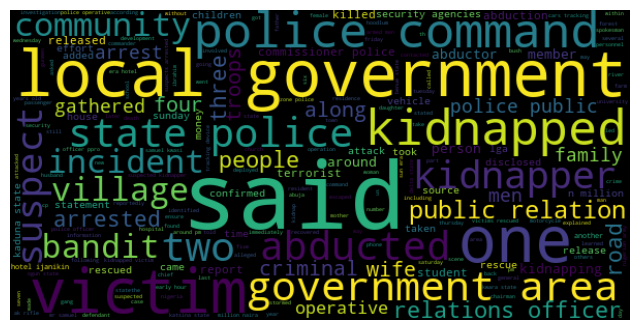

In [278]:
# visualizing patterns in for kidnapping crimes
k_crime = ' '.join([text for text in dk2['processed_Text'][dk2['Category'] == 'kidnapping']])
wordcloud = WordCloud(width=600, height=300,random_state=21, max_font_size=90).generate(k_crime)
plt.figure(figsize=(8, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

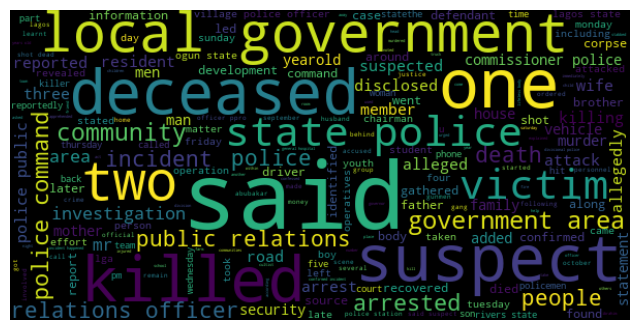

In [279]:
# visualizing patterns in for murder crimes
m_crime = ' '.join([text for text in dk2['processed_Text'][dk2['Category'] == 'murder']])
wordcloud = WordCloud(width=600, height=300,random_state=21, max_font_size=90).generate(m_crime)
plt.figure(figsize=(8, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

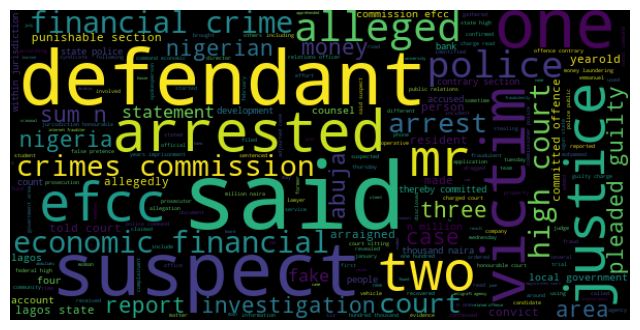

In [280]:
# visualizing patterns in for fraud crimes
f_crime = ' '.join([text for text in dk2['processed_Text'][dk2['Category'] == 'fraud']])
wordcloud = WordCloud(width=600, height=300,random_state=21, max_font_size=90).generate(f_crime)
plt.figure(figsize=(8, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

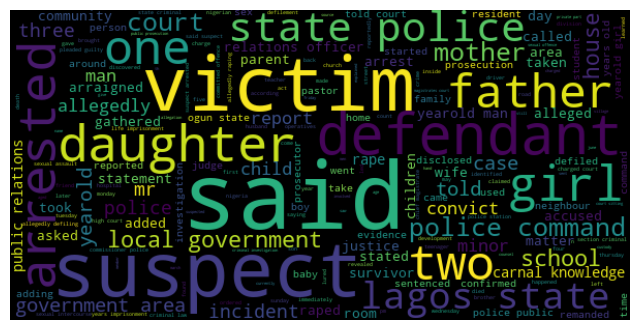

In [281]:
# visualizing patterns in for abuse crimes
ab_crime = ' '.join([text for text in dk2['processed_Text'][dk2['Category'] == 'abuse']])
wordcloud = WordCloud(width=600, height=300,random_state=21, max_font_size=90).generate(ab_crime)
plt.figure(figsize=(8, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

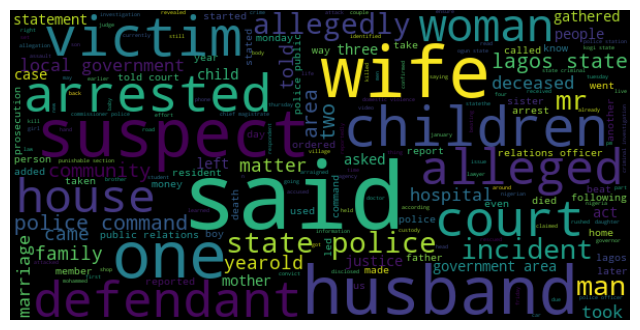

In [282]:
# visualizing patterns in for violence crimes
dv_crime = ' '.join([text for text in dk2['processed_Text'][dk2['Category'] == 'domestic-violence']])
wordcloud = WordCloud(width=600, height=300,random_state=21, max_font_size=90).generate(dv_crime)
plt.figure(figsize=(8, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()